In [65]:
import numpy as np
import h5py
import os
import scipy.io
import pickle

data_dir = '/home/taehyun/workspace/childtoy/MotionReasoning/dataset/mocap_emotion_rig/'
# file_name = 'emotion_f01_angry_0_1.mat'
data_list = os.listdir(data_dir)
data_list.sort()
l_subject = []
l_emotion = []
l_scene = []
l_repeat = []
root_p = []
q_values = []
for i in data_list : 
    names = i.split('_')
    l_subject.append(names[1])
    l_emotion.append(names[2])
    l_scene.append(names[3])
    l_repeat.append(names[4].split('.')[0])
    mat = scipy.io.loadmat(os.path.join(data_dir, i))
    q_values.append(mat['q_revs_post'])
    root_p.append(mat['T_roots_post'])



In [69]:
def write_pkl(l_subject, l_emotion, l_scene, l_repeat, q_values, root_p):
    # This uses method provided with LAFAN1.
    # X and Q are local position/quaternion. Motions are rotated to make 10th frame facing X+ position.
    # Refer to paper 3.1 Data formatting
    input_data = {}
    input_data["label_subject"] = l_subject  # q_{t}
    input_data["label_emotion"] = l_emotion
    input_data["label_scene"] = l_scene
    input_data["label_repeat"] = l_repeat
    input_data["local_q"] = q_values
    input_data["root_p"] = root_p
    return input_data


In [71]:
import pickle

In [73]:
data = write_pkl(l_subject, l_emotion, l_scene, l_repeat, q_values, root_p)
pickle_name = "emotion_mocap_post_data.pkl"
with open(pickle_name, 'wb') as f:
    pickle.dump(data, f, pickle.HIGHEST_PROTOCOL)


In [1]:
import numpy as np
import h5py
import os
import scipy.io
import pickle
data_dir = '/Users/taehyun/workspace/childtoy/MotionReasoning/style_transfer/data/mocap_emotion_rig/'


In [12]:
subjects = []
seq_names = []
scenes = []
repeats = []
X = []
Q = []
Q_vel = []
Q_acc = []

# Extract
mat_files = sorted(os.listdir(data_dir))
for file in mat_files:
    if file.endswith(".mat"):
        file_info = file.split('_')
        subject = file_info[1]
        seq_name = file_info[2]
        scene = file_info[3]
        repeat = file_info[4].split('.')[0]
        seq_path = os.path.join(data_dir, file)
        data = scipy.io.loadmat(seq_path)
        q_base = np.concatenate([data['q_revs_post'], np.zeros([1,data['q_revs_post'].shape[1]])],axis=0)
        q_vel = q_base[1:, :] - q_base[:-1,:]
        q_vel_base = np.concatenate([np.zeros([1,q_vel.shape[1]]), q_vel], axis=0)
        q_acc = q_vel_base[1:, :] - q_vel_base[:-1, :]
        
        # Sliding windows
        i = 0
        window=40 # 2 sec
        offset = 10 # 0.5sec
        while i + window < data['T_roots_post'].shape[1]:
            Q.append(data['q_revs_post'][i:i+window,:])
            Q_vel.append(q_vel[i:i+window, :])
            Q_acc.append(q_acc[i:i+window, :])
            X.append(data['T_roots_post'][:,i:i+window])                
            subjects.append(subject)
            seq_names.append(seq_name)
            scenes.append(scene)
            repeats.append(repeat)
            i += offset
    if file != mat_files[0]:
        break

In [26]:
for i in range(10):
    print(Q[i].shape)

15071

In [49]:
meean_q = np.asarray(Q).mean(axis=(0,1))
std_q = np.std(np.asarray(Q), axis=(0,1))
mean_vel = np.asarray(Q_vel).mean(axis=(0,1))
std_vel = np.std(np.asarray(Q_vel), axis=(0,1))
mean_acc = np.asarray(Q_acc).mean(axis=(0,1))
std_acc = np.std(np.asarray(Q_acc), axis=(0,1))


In [50]:
seq_names

['angry',
 'angry',
 'angry',
 'angry',
 'angry',
 'angry',
 'angry',
 'angry',
 'angry',
 'angry',
 'angry',
 'angry',
 'angry',
 'angry',
 'angry',
 'angry',
 'angry',
 'angry',
 'angry',
 'angry',
 'angry',
 'angry']

In [48]:
std_vel

array([0.01522966, 0.00985525, 0.06044112, 0.02586913, 0.14775538,
       0.13697433, 0.13871253, 0.18776006, 0.10817291, 0.07562242,
       0.12675271, 0.13440436, 0.1144077 , 0.11650452, 0.15822637,
       0.09857157, 0.04692614, 0.09411931, 0.07080907, 0.07688829,
       0.06589424, 0.12913037, 0.06310672, 0.0050653 , 0.01708258,
       0.11636561, 0.07551178, 0.11006582, 0.11279512, 0.05434905,
       0.00933509, 0.02997495, 0.04833115, 0.0810953 , 0.09800315])

(array([[ 0.,  0.,  5.,  6.,  7.,  4.,  0.,  0.,  0.,  0.],
        [ 0.,  1.,  2.,  8.,  8.,  2.,  0.,  1.,  0.,  0.],
        [ 0.,  1.,  5., 10.,  1.,  4.,  0.,  0.,  0.,  1.],
        [ 0.,  1.,  4., 10.,  4.,  1.,  1.,  0.,  0.,  1.],
        [ 0.,  1.,  2.,  8.,  9.,  0.,  1.,  1.,  0.,  0.],
        [ 1.,  0.,  3.,  6.,  9.,  2.,  1.,  0.,  0.,  0.],
        [ 1.,  2.,  0.,  7.,  9.,  2.,  0.,  1.,  0.,  0.],
        [ 1.,  2.,  1.,  8.,  6.,  3.,  0.,  1.,  0.,  0.],
        [ 1.,  0.,  5.,  3.,  9.,  1.,  2.,  1.,  0.,  0.],
        [ 0.,  2.,  2.,  6.,  8.,  1.,  1.,  2.,  0.,  0.],
        [ 0.,  0.,  4.,  5.,  8.,  4.,  1.,  0.,  0.,  0.],
        [ 0.,  1.,  2.,  7.,  9.,  2.,  0.,  1.,  0.,  0.],
        [ 0.,  2.,  5.,  9.,  1.,  4.,  0.,  0.,  0.,  1.],
        [ 0.,  2.,  5.,  9.,  3.,  1.,  1.,  0.,  0.,  1.],
        [ 0.,  2.,  3.,  8.,  7.,  0.,  1.,  1.,  0.,  0.],
        [ 1.,  0.,  4.,  6.,  8.,  2.,  1.,  0.,  0.,  0.],
        [ 1.,  2.,  1.,  6.,  9.,  2.,  

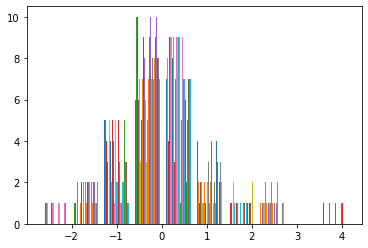

In [45]:
plt.hist(((np.asarray(Q_vel)- mean_vel)/std_vel)[:,:,0])

(array([[ 0.,  0.,  0.,  0.,  3., 10.,  8.,  1.,  0.,  0.],
        [ 0.,  0.,  0.,  0.,  1., 13.,  5.,  2.,  0.,  1.],
        [ 0.,  0.,  0.,  1.,  2., 15.,  3.,  0.,  1.,  0.],
        [ 0.,  0.,  0.,  1.,  8., 11.,  1.,  1.,  0.,  0.],
        [ 0.,  0.,  0.,  2.,  3., 15.,  1.,  1.,  0.,  0.],
        [ 0.,  0.,  0.,  0.,  4., 14.,  2.,  1.,  0.,  1.],
        [ 0.,  0.,  0.,  0.,  2., 12.,  5.,  1.,  2.,  0.],
        [ 0.,  0.,  0.,  1.,  5., 10.,  6.,  0.,  0.,  0.],
        [ 1.,  0.,  0.,  0.,  7., 13.,  1.,  0.,  0.,  0.],
        [ 0.,  1.,  0.,  2.,  3., 11.,  5.,  0.,  0.,  0.],
        [ 0.,  0.,  0.,  0.,  4.,  9.,  8.,  1.,  0.,  0.],
        [ 0.,  0.,  0.,  0.,  1., 12.,  6.,  2.,  0.,  1.],
        [ 0.,  0.,  0.,  1.,  2., 14.,  4.,  0.,  1.,  0.],
        [ 0.,  0.,  0.,  1.,  8., 11.,  1.,  1.,  0.,  0.],
        [ 0.,  0.,  0.,  2.,  3., 15.,  1.,  1.,  0.,  0.],
        [ 0.,  0.,  0.,  0.,  4., 14.,  2.,  1.,  0.,  1.],
        [ 0.,  0.,  0.,  0.,  2., 12.,  

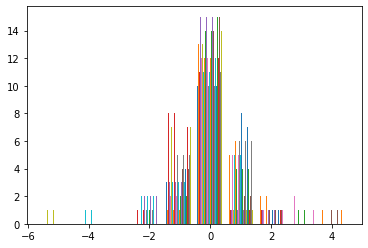

In [35]:
import matplotlib.pyplot as plt
plt.hist(((np.asarray(Q_acc) - np.asarray(Q_acc).mean(axis=(0,1)))/np.std(np.asarray(Q_acc), axis=(0,1)))[:,:,1])

In [27]:
np.std(np.asarray(Q_vel), axis=(0,1)).shape

(35,)

In [16]:
mat['chains'].shape

array([[array([[(array(['kinematic_chain'], dtype='<U15'), array([[0.01]]), array([[(array(['Hips'], dtype='<U4'), array([[0],
       [0],
       [0]], dtype=uint8), array([[ 0.1674171 ,  0.00429248,  0.98587681],
       [ 0.98583781,  0.00917386, -0.16745042],
       [-0.00976307,  0.99994871, -0.00269583]]), array([[0],
       [0],
       [0]], dtype=uint8), array(['fixed'], dtype='<U5'), array([[nan],
       [nan],
       [nan]]), array([[nan, nan, nan],
       [nan, nan, nan],
       [nan, nan, nan]]), array([[0]], dtype=uint8), array([[0]], dtype=uint8), array([[0]], dtype=uint8), array([[0]], dtype=uint8), array([[0]], dtype=uint8), array([[0],
       [0],
       [0]], dtype=uint8), array([[0],
       [0],
       [0]], dtype=uint8), array([[0],
       [0],
       [0]], dtype=uint8), array([[0],
       [0],
       [0]], dtype=uint8), array([[0],
       [0],
       [0]], dtype=uint8), array([[0]], dtype=uint8), array([[0],
       [0],
       [0]], dtype=uint8), array([], shape=(0, 